# Problem Statement 

When the lending club company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:

- If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company
- If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

#### The company wants to understand the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default.  The company can utilise this knowledge for its portfolio and risk assessment. 

### Data Description

##### Loan_Amount: Amount requested by applicant
##### Funded Amount: The total amount commited to that loan at that point of time
##### Term: Loan duration term in months
##### int_rate : Interest Rate on the loan
##### installment : The monthly payment owed by the borrower if the loan originates.
##### grade: Lending club assigned grade
##### sub_grade: Lending club assigned sub-grade (within grade)
##### emp_title: The job title supplied by the Borrower when applying for the loan.*
##### emp_length: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 
##### home_ownership: The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.
##### annual_inc: The self-reported annual income provided by the borrower during registration.
##### verification_status: Indicates if income was verified by Lending club, not verified, or if the income source was verified
##### issue_d: The month which the loan was funded
##### loan_status: Current status of the loan. It can be fully paid or charged off or current 
##### purpose: A category provided by the borrower for the loan request. 
##### title: The loan title provided by the borrower
##### addr_state: The state provided by the borrower in the loan application
##### dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.
##### mths_since_last_delinq: The number of months since the borrower's last delinquency
##### mths_since_last_record: The number of months since the last public record.
##### revol_util: Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
##### collections_12_mths_ex_med: Number of collections in 12 months excluding medical collections
##### chargeoff_within_12_mths: Number of charge-offs within 12 months
##### pub_rec_bankruptcies: Number of public record bankruptcies
##### tax_liens: Number of tax liens
##### recoveries: post charge off gross recovery


## Tips to read this notebook:
    
   1.  All analysis will be marked as **Driving factors**/**Observation**/**Trend**
          Driving factor - Features that lead to more probability of charged off
          Observation- Fact observed from the data
          Trend - How a feature is correlated to other/ Influence of one feature to another 
          
   2.  The notebook is divided into following steps:
       1.  Importing libraries
       2.  Data Reading
       3.  Data Cleaning
           - visualizing null values before data cleaning
           - removing columss with all null values
           - removing columns with all same values
           - removing columns with null values > 60%
           - removing columns with distinct values
           - removing columns with customer behaviour
           - Analyzing remaining null values and replacing with mode/mean/median depending upon the scenario
           - Visualizing null values after data cleaning
       4.  Data Types Analysis and Conversion
       5.  Treat Outliers, Analyze skewness, kurtosis
       6.  Data Formatting
       7.  Data Summary 
       8.  Data Integrity Checks
       9.  Univariate Analaysis and creating transformed Columns for analysis
       10. Bivariate Analysis
       11. Multivariate analysis
       

## Step 1 -  Import libraries

In [1072]:


#Load the libraries
import pandas as pd #To work with dataset
import numpy as np 
import seaborn as sns #Graph library that use matplot in background
import matplotlib as mpl #graph library
import math #for math calculations
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

#plotly for graphs
import plotly.graph_objs as go
import plotly.offline as py 
from plotly.offline import plot, iplot, init_notebook_mode
import plotly.graph_objs as go

init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings("ignore")



ModuleNotFoundError: No module named 'wordcloud'

## Step 2-  Read dataset

In [1096]:
#reading the dataset into pandas dataframe
loandata=pd.read_csv("loan.csv",  low_memory=False)
loandata.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [1097]:
print(loandata.shape)

(39717, 111)


In [1098]:
print("There are a total of", loandata.shape[0] ,"rows and ",loandata.shape[1]," coloumns")

There are a total of 39717 rows and  111  coloumns


## Step 3- Data Cleaning
## Visualizing null values before data cleaning

<AxesSubplot:>

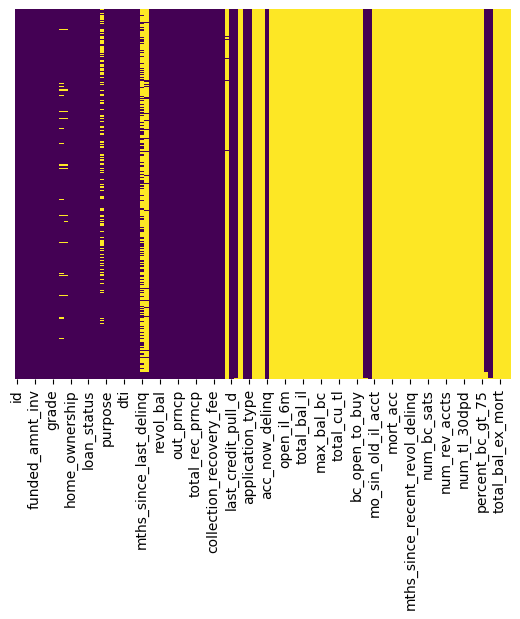

In [1099]:
sns.heatmap(loandata.isnull(),yticklabels=False,cbar=False, cmap="viridis")

## 1. Remove columns with all null values

In [1100]:
#check how many columns with null records
nullcount=loandata.isna().sum()



Columns with all null values are not useful for our analysis
Count of columns with all null values as 54
Remaining columns after first drop : columnslisttoconsider, count is 57

In [1101]:

columnslistwithallnull =[]
columnslisttoconsider= []
for index, value in nullcount.items():
    if value==len(loandata):
       columnslistwithallnull.append(index) 
    else:
       columnslisttoconsider.append(index)
print("Columns to drop as they have all null values:", len(columnslistwithallnull))
#print(" Dropped columns in this step", columnslistwithallnull)
print("Remaining columns", len(columnslisttoconsider)) 

Columns to drop as they have all null values: 54
Remaining columns 57


## 2.  Remove columns with same value across the dataset, these columns will not be useful to analysis


In [1102]:

newcolstoconsider=[]
samevaluecols=[]
for i in columnslisttoconsider:
    if len(loandata[i].value_counts())==1:
       samevaluecols.append(i) 
    else:
       newcolstoconsider.append(i)
print("Columns to drop as they have all same values:", len(samevaluecols)) 
#print(" Dropped columns in this step", samevaluecols)
print("Remaining columns", len(newcolstoconsider)) 


Columns to drop as they have all same values: 9
Remaining columns 48


Get all columns to drop as new variable colstodrop (54+9)

In [1103]:


colstodrop=columnslistwithallnull+samevaluecols
len(colstodrop)

63

## 3. Drop columns and create a new dataframe


In [1104]:
loandata=loandata.drop(axis=1,  columns=colstodrop)

## 4. Remove columns where there are all distinct values, this is not useful for our analysis

In [1105]:
alldistinctvalues=[]
for index,value in loandata.nunique().items():
    if value == len(loandata):
        alldistinctvalues.append(index)
print(alldistinctvalues)
loandata=loandata.drop(axis=1,  columns=alldistinctvalues)
# Clearly, these columns can also be remmoved as they wont add value in the analysis

['id', 'member_id', 'url']


## Check shape of new dataset after dropping columns

In [1106]:
print(loandata.shape)
print("There are a total of", loandata.shape[0] ,"rows and ",loandata.shape[1]," coloumns")

(39717, 45)
There are a total of 39717 rows and  45  coloumns


## 5. Drop columns with most null values
## Criteria is if null values is greater than 60% 

In [1107]:

mostnullvalues=[]
for index,value in loandata.isna().sum().items():
    if value > len(loandata)*0.6:
        mostnullvalues.append(index)
print(mostnullvalues)

loandata=loandata.drop(axis=1,  columns=mostnullvalues)

['mths_since_last_delinq', 'mths_since_last_record', 'next_pymnt_d']


In [1108]:

print(loandata.shape)
print("There are a total of", loandata.shape[0] ,"rows and ",loandata.shape[1]," coloumns")

(39717, 42)
There are a total of 39717 rows and  42  coloumns


## 6. Drop customer behaviour variables, After studying the data dictionary, further dropping columns customer behaviour variables

In [1109]:
# Open
colstodropfurther=["delinq_2yrs","earliest_cr_line","inq_last_6mths","open_acc","pub_rec","revol_bal","total_acc","out_prncp","out_prncp_inv","total_pymnt","total_pymnt_inv","total_rec_prncp","total_rec_int","total_rec_late_fee","recoveries","collection_recovery_fee","last_pymnt_d","last_pymnt_amnt","last_credit_pull_d"]
loandata=loandata.drop(axis=1,  columns=colstodropfurther)

## 7. Based On data understanding, removing desc as it will not be useful for our analysis

In [1110]:
loandata=loandata.drop(axis=1,  columns=["desc"])

## list of columns

In [1111]:

print(loandata.shape)
print("There are a total of", loandata.shape[0] ,"rows and ",loandata.shape[1]," coloumns")

(39717, 22)
There are a total of 39717 rows and  22  coloumns


In [1112]:
### 7. Analyzing null values in remaining columns 

In [1113]:
total_missing = loandata.isnull().sum().sort_values(ascending=False)
percent_missing = (loandata.isnull().sum()/loandata.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total_missing,round(percent_missing,2)*100],axis=1,keys=['Total','Percentage Missing'])
missing_data

,Total,Percentage Missing
emp_title,2459,6.0
emp_length,1075,3.0
pub_rec_bankruptcies,697,2.0
revol_util,50,0.0
title,11,0.0
verification_status,0,0.0
dti,0,0.0
addr_state,0,0.0
zip_code,0,0.0
purpose,0,0.0


##  Visualizing Null values after Data cleaning

<AxesSubplot:>

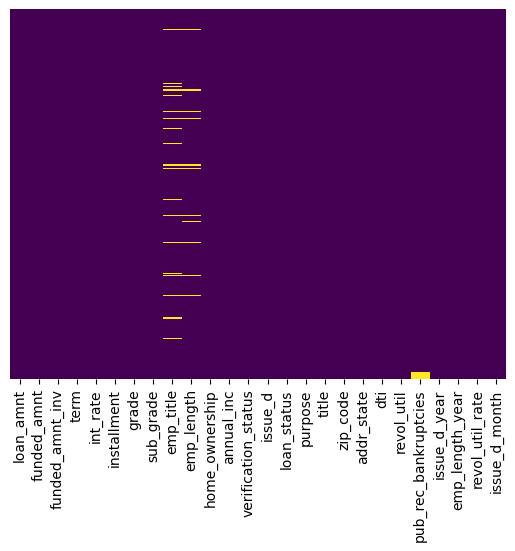

In [1117]:
sns.heatmap(loandata.isnull(),yticklabels=False,cbar=False, cmap="viridis")

## Data Types Formatting

In [1122]:
loandata["int_rate"]=loandata["int_rate"].apply(lambda x: float(x[:-1]))

## Data Transformation

In [1119]:
#step2 
#data formatting for issue_d (extract year alone to new column)
def parseData(x):
    lis = x.split("-")
    return '20'+lis[1]
loandata["issue_d_year"]=loandata["issue_d"].apply(lambda x:parseData(x))

#data formatting for parse emp year, process <year, 10+year, 10+year
def parseEmpYear(x):
    if pd.isna(x):
        x = '0'
    if 'years' in x:
        x = x.replace('years','')
    if 'year' in x:
        x = x.replace('year','')    
    if '<' in x:
        x = x.replace('<','')
    if '+' in x:
        x = x.replace('+','') 
    x = x.strip()    
    return int(x)
loandata['emp_length_year'] = loandata['emp_length'].apply(lambda x:parseEmpYear(x))

#parse revol_util_rate
def parseRevolRate(x):
    x = str(x)
    if x == "":
        x = '0'
    if '%' in x:
        x = x.replace('%','')
    return float(x)
loandata["revol_util_rate"]=loandata["revol_util"].apply(lambda x:parseRevolRate(x))

def parseMon(x):
    lis = x.split("-")
    return lis[0]
loandata["issue_d_month"]=loandata["issue_d"].apply(lambda x:parseMon(x))



## We have now concluded final list of columns from 111 to 22 after cleaning based on null values, distinct values


## Open-Shruti Step 5 - Data Summary

## Open-Jeyashree to check on zip code

## Step 8 -  Data integrity checks
## Ideally loan_amnt >=  funded_amnt >=  funded_amnt_inv

## No data quality issues observed

In [1120]:

loandata["valid"]=loandata["loan_amnt"]-loandata["funded_amnt"]
loandata["valid"]=loandata["valid"].apply(lambda x: True if x >=0 else False)
loandata["valid"].value_counts()


# check for data issues
#Ideally funded_amnt >= funded_amnt_inv
loandata["valid"]=loandata["funded_amnt"]-loandata["funded_amnt_inv"]
loandata["valid"]=loandata["valid"].apply(lambda x: True if x >=0 else False)
print(loandata["valid"].value_counts())
loandata=loandata.drop(axis=1,  columns=["valid"])


True    39717
Name: valid, dtype: int64


## Step - 6 Treating outliers



# Univariate for continuous values

## Checking outliers for continous values
- **int_rate** - no removal of outliers needed as skew and kurtosis is within limits skew(-1, +1) , kurtosis(-7,+7)
- **funded_amnt** - no removal of outliers needed as skew and kurtosis is within limits skew(-1, +1) , kurtosis(-7,+7)
- **funded_amnt_inv** - no removal of outliers needed as skew and kurtosis is within limits skew(-1, +1) , kurtosis(-7,+7)
- **loan_amnt** - We need to remove outliers
- **annual_inc** - We need to remove outliers
- **installment** -  We need to remove outliers
- **dti** - no removal of outliers needed as skew and kurtosis is within limits skew(-1, +1) , kurtosis(-7,+7)




## 1. int_rate


Skew 0.2937286765747475
Kurtosis -0.4466647749329957


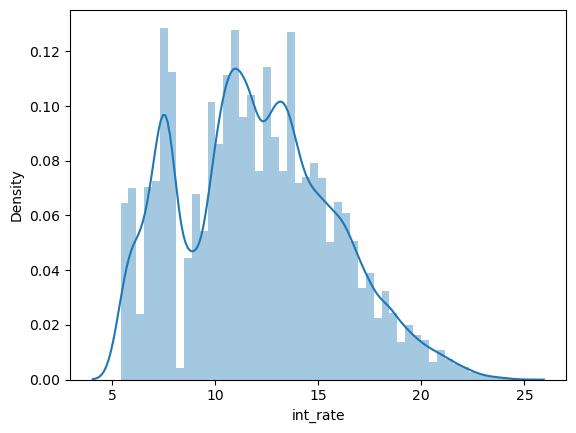

In [1123]:
sns.distplot(loandata["int_rate"])
print("Skew", loandata["int_rate"].skew())
print("Kurtosis",loandata["int_rate"].kurtosis())
#looking at outliers

<AxesSubplot:xlabel='int_rate'>

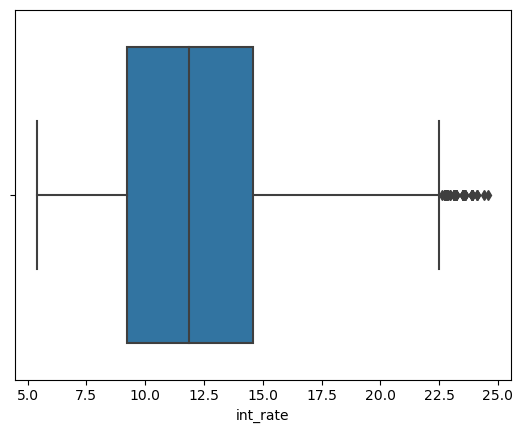

In [1124]:
sns.boxplot(loandata["int_rate"])


## 2. Loan Amount - Removing outliers

In [1125]:
q1=loandata['loan_amnt'].quantile(q=0.25)
q3=loandata['loan_amnt'].quantile(q=0.75)
IQR=q3-q1
IQR
loan_upper=q3+(1.5*IQR)
loan_lower=q1-(1.5*IQR)

percentage_removed=len(loandata[loandata['loan_amnt']>loan_upper])/len(loandata)*100
print(round(percentage_removed,2), "% data has loan amount greater than the upper threshold", loan_upper)
percentage_removed_lower=len(loandata[loandata['loan_amnt']<loan_lower])/len(loandata)*100
print(round(percentage_removed_lower,2), "% data has loan amount lesser than the lower threshold", loan_lower)
loandata=loandata[(loandata['loan_amnt'] > loan_lower) & (loandata['loan_amnt'] < loan_upper)]
print("Shape after removing")
loandata.shape

3.1 % data has loan amount greater than the upper threshold 29250.0
0.0 % data has loan amount lesser than the lower threshold -8750.0
Shape after removing


(38487, 26)

Skew 0.7362405646818562
Kurtosis -0.26256950113108113


count    38487.000000
mean     10521.750201
std       6441.089924
min        500.000000
25%       5125.000000
50%       9600.000000
75%      15000.000000
max      29175.000000
Name: loan_amnt, dtype: float64

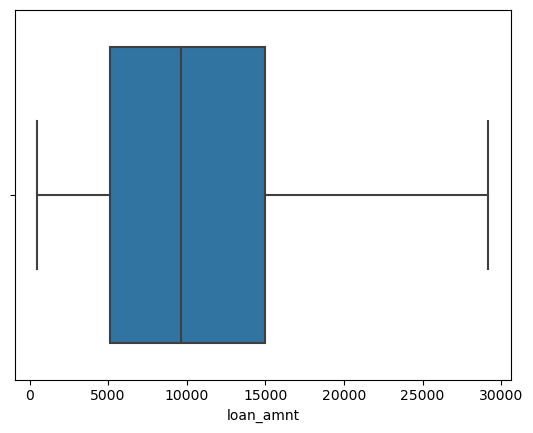

In [1126]:
sns.boxplot(loandata["loan_amnt"])

print("Skew", loandata["loan_amnt"].skew())
print("Kurtosis",loandata["loan_amnt"].kurtosis())
loandata["loan_amnt"].describe()

## 3. Funded Amount

Skew 0.756127242792522
Kurtosis -0.14191029653535958


<AxesSubplot:xlabel='funded_amnt', ylabel='Density'>

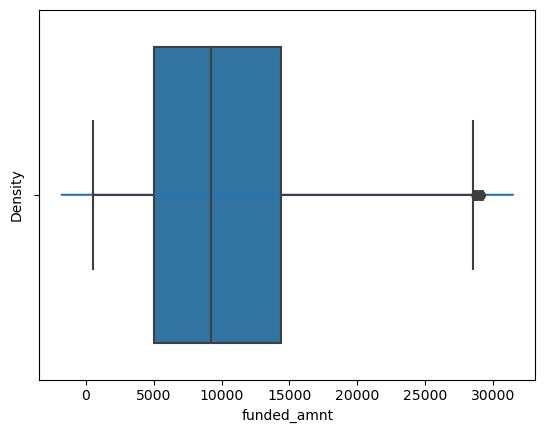

In [1127]:

sns.distplot(loandata["funded_amnt"])
print("Skew", loandata["funded_amnt"].skew())
print("Kurtosis",loandata["funded_amnt"].kurtosis())
sns.boxplot(loandata["funded_amnt"])


## 4. Funded Amount Invested

Skew 0.7725696905330575
Kurtosis -0.056250091558897264


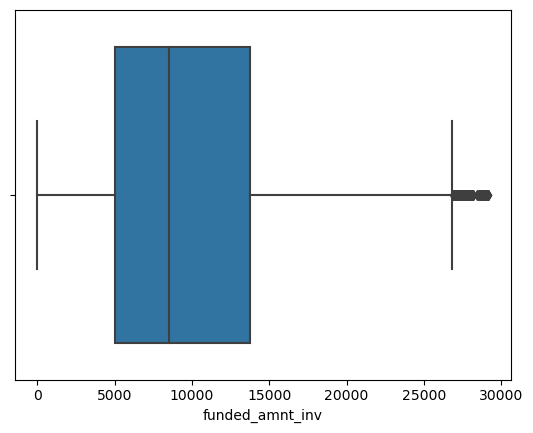

In [1130]:
sns.boxplot(loandata["funded_amnt_inv"])
print("Skew", loandata["funded_amnt_inv"].skew())
print("Kurtosis",loandata["funded_amnt_inv"].kurtosis())



## 5. Installment

## Removing outliers


Skew 0.9182901635742915
Kurtosis 0.48526804038527294
2.86 % data has installment greater than the upper threshold 771.58
0.0 % data has installment lesser than the lower threshold -200.18000000000004


(37386, 26)

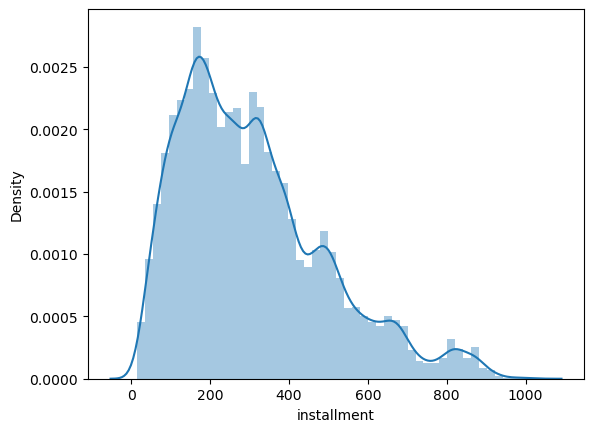

In [1131]:

loandata["installment"].describe()
sns.distplot(loandata["installment"])
print("Skew", loandata["installment"].skew())
print("Kurtosis",loandata["installment"].kurtosis())
#no duplicate ID

q1=loandata['installment'].quantile(q=0.25)
q3=loandata['installment'].quantile(q=0.75)
IQR=q3-q1
IQR
installment_upper=q3+(1.5*IQR)
installment_lower=q1-(1.5*IQR)

percentage_removed=len(loandata[loandata['installment']>installment_upper])/len(loandata)*100
print(round(percentage_removed,2), "% data has installment greater than the upper threshold", installment_upper)
percentage_removed_lower=len(loandata[loandata['installment']<=installment_lower])/len(loandata)*100
print(round(percentage_removed_lower,2), "% data has installment lesser than the lower threshold", installment_lower)

loandata=loandata[(loandata['installment'] > installment_lower) & (loandata['installment'] < installment_upper)]
loandata.shape



## 6. Annual Income
## Removing outliers



<AxesSubplot:xlabel='annual_inc'>

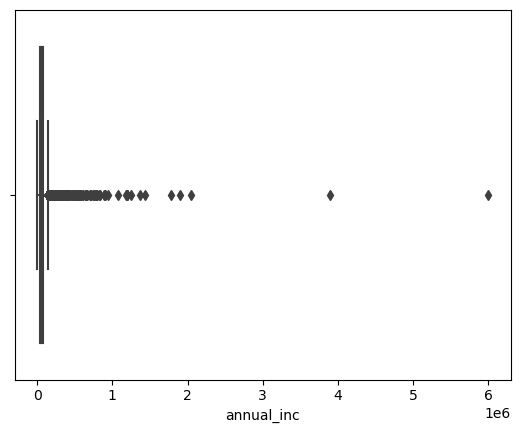

In [1132]:
sns.boxplot(loandata["annual_inc"])

<AxesSubplot:xlabel='annual_inc', ylabel='Count'>

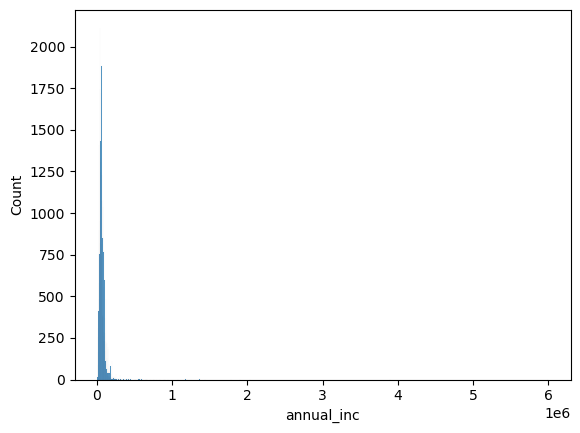

In [1133]:
sns.histplot(loandata["annual_inc"])

In [1134]:
print("Skew", loandata["annual_inc"].skew())
print("Kurtosis",loandata["annual_inc"].kurtosis())

q1=loandata['annual_inc'].quantile(q=0.25)
q3=loandata['annual_inc'].quantile(q=0.75)
IQR=q3-q1

income_upper=q3+(1.5*IQR)
income_lower=q1-(1.5*IQR)



percentage_removed=len(loandata[loandata['annual_inc']>income_upper])/len(loandata)*100
print(round(percentage_removed,2), "% data has annual_inc greater than the upper threshold", income_upper)
percentage_removed_lower=len(loanda
                             ta[loandata['annual_inc']<=income_lower])/len(loandata)*100
print(round(percentage_removed_lower,2), "% data has annual_inc lesser than the lower threshold", income_lower)

loandata=loandata[(loandata['annual_inc'] > income_lower) & (loandata['annual_inc'] < income_upper)]
loandata.shape


SyntaxError: invalid syntax (Temp/ipykernel_26300/2943293347.py, line 16)

(34815, 34)

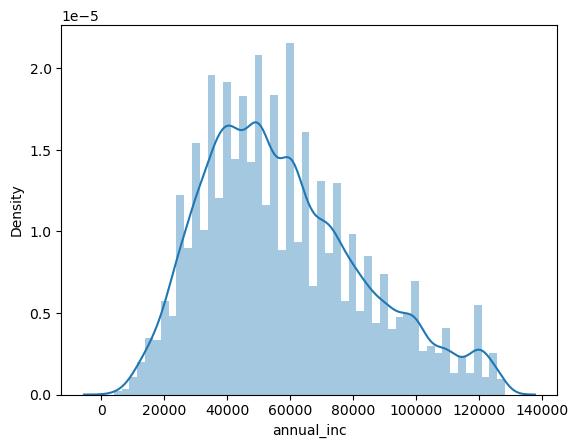

In [1015]:
sns.distplot(loandata["annual_inc"])
loandata.shape

## 7. Dti 

In [ ]:
sns.boxplot(loandata["dti"])

In [1017]:
loandata.shape

(34080, 26)

# Univariate analysis of categorical values and Creating custom columns for analysis
    - Univariate analysis will lead to further data cleaning, data transformations if required

## 1. Loan status

<AxesSubplot:>

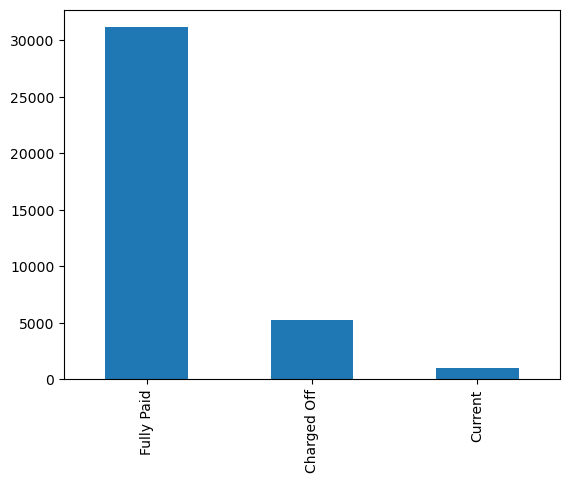

In [1136]:
loandata["loan_status"].value_counts().plot(kind='bar')


## Since loan_status=current, doesnot give us data of defaulters, hence removing this
## Data cleaning after univariate analaysis

In [1137]:

loandata=loandata[~(loandata["loan_status"]=="Current")]
loandata.shape

(36380, 26)

## 2. Term

## Observation - Most people applying for loan have a loan term of 36 months

 36 months    27712
 60 months     8668
Name: term, dtype: int64


<AxesSubplot:>

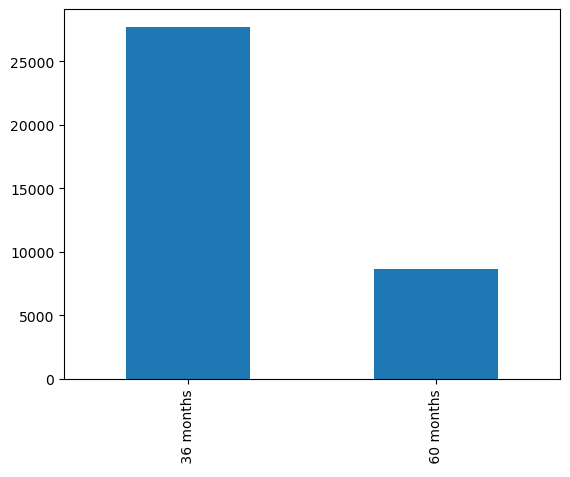

In [1138]:

print(loandata["term"].value_counts())
loandata["term"].value_counts().plot(kind='bar')

## 3. Grade and Subgrade

## Observation - Grade A and B seems to have majority of the dataset (57%)

B    0.303161
A    0.272155
C    0.206020
D    0.127763
E    0.063057
F    0.021633
G    0.006212
Name: grade, dtype: float64


<AxesSubplot:>

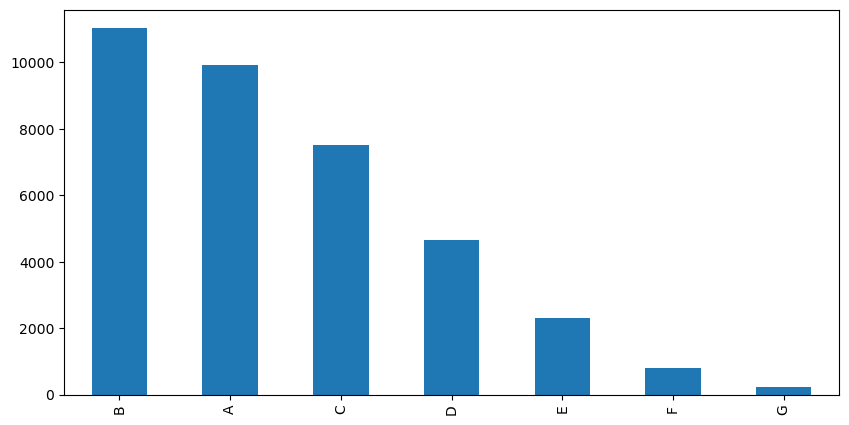

In [1139]:
print(loandata["grade"].value_counts(1))
loandata["grade"].value_counts().plot(kind='bar',figsize=(10,5))

## 4. Employment title
### Combining all sparse values to Others for easier analysis, created a separate column with transformed data
### Criteria for Others if count <25

In [1140]:
loandata["emp_title"].value_counts()
emp_title_array=[]
emp_buckets=loandata["emp_title"].value_counts()
for i, value in emp_buckets.items():
    if(value >= 25):
        emp_title_array.append(i)
loandata["emp_title_modified"]=loandata["emp_title"].apply(lambda x: x if x in emp_title_array  else "Others")
loandata["emp_title_modified"].value_counts()

Others                          34903
US Army                           117
Bank of America                   104
IBM                                54
AT&T                               51
Kaiser Permanente                  50
US Air Force                       50
Wells Fargo                        50
UPS                                47
USAF                               46
Walmart                            44
United States Air Force            41
Verizon Wireless                   37
US ARMY                            36
USPS                               36
Self Employed                      36
JP Morgan Chase                    35
Self                               35
Lockheed Martin                    35
Target                             35
State of California                34
JPMorgan Chase                     34
U.S. Army                          34
Northrop Grumman                   33
Department of Defense              32
US Navy                            32
Booz Allen H

## 5.  employment length 


### Observation - Employees with 10+ , and <=1 form a greater percentage in loandata


<AxesSubplot:>

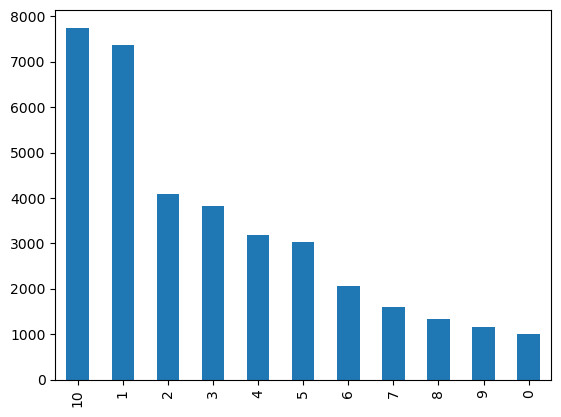

In [1141]:

loandata["emp_length_year"].value_counts().plot(kind='bar')


## 6. Home ownership
### Removing None and and replacing with OTHER
### No univariate insights from home_ownership

RENT        17798
MORTGAGE    15646
OWN          2839
OTHER          97
Name: home_ownership, dtype: int64

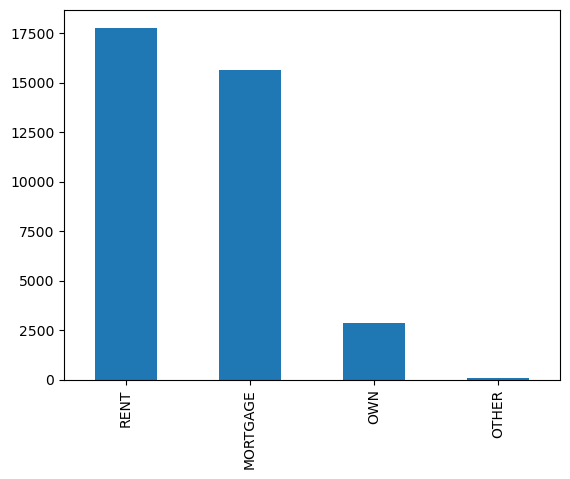

In [1142]:
loandata["home_ownership"].value_counts()
loandata["home_ownership"]=loandata["home_ownership"].apply(lambda x: "OTHER" if x =="NONE" else x)
loandata["home_ownership"].value_counts()
loandata["home_ownership"].value_counts().plot(kind="bar")
loandata["home_ownership"].value_counts()

In [1143]:
loandata.shape

(36380, 27)

## 7. loan issue date  
#### Analyzing issue date and extracting year as a separate column
## Observation Year 2011 has most people in loandata 
## Observation December has highest number of loan takers

<AxesSubplot:>

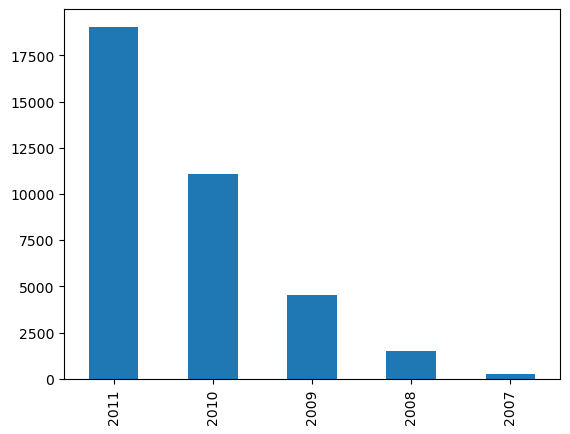

In [1144]:
loandata["issue_d_year"].value_counts().plot(kind="bar")

#2011 has most people applying for loans
#within 2011, November has most people applying for loans




<AxesSubplot:>

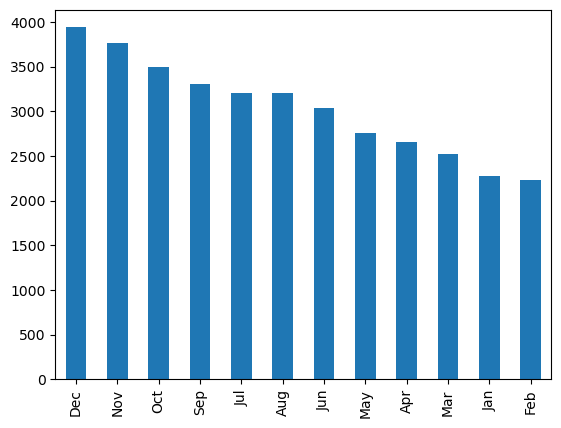

In [1145]:
loandata["issue_d_month"].value_counts().plot(kind="bar")

## 8. Verification status
## Observation - Most loan applicants have verification status as non-verified

<AxesSubplot:>

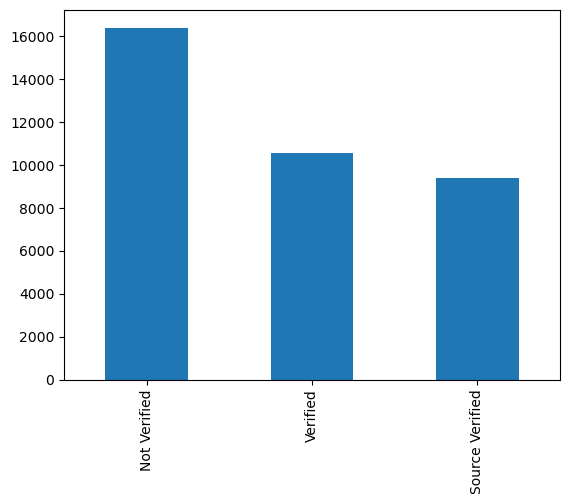

In [1146]:
loandata["verification_status"].value_counts().plot(kind="bar")

## 9. Purpose
## Observation - most people have debt_consolidation as purpose

In [1147]:
loandata["purpose"].value_counts()

debt_consolidation    16825
credit_card            4750
other                  3756
home_improvement       2661
major_purchase         2095
small_business         1541
car                    1493
wedding                 902
medical                 674
moving                  562
vacation                373
house                   333
educational             318
renewable_energy         97
Name: purpose, dtype: int64

## 10. Title 
## Observation - After analyzing title column, most occuring title are related to debt consolidation
### Hence this can be dropped as debt consolidation is already captured in purpose

In [1148]:
loandata["title"].value_counts()

Debt Consolidation                   1905
Debt Consolidation Loan              1455
Personal Loan                         612
debt consolidation                    445
Consolidation                         442
                                     ... 
Start investing the markets             1
Make Sense of the World                 1
Bathroom and Room Remodeling Loan       1
Free at Last!                           1
JAL Loan                                1
Name: title, Length: 18426, dtype: int64

In [1149]:
%matplotlib inline
mpl.rcParams['figure.figsize']=(10,10)             
mpl.rcParams['savefig.dpi']=100      
mpl.rcParams['figure.subplot.bottom']=.1 
stopwords = set(STOPWORDS)

wordcloud = WordCloud(
                          background_color='white',
                          stopwords=stopwords,
                          max_font_size=150, 
                          random_state=0
                         ).generate(' '.join(loandata['purpose'].tolist()))

print(wordcloud)
fig = plot.figure(1)
plot.imshow(wordcloud)
plot.axis('off')
plot.show();

NameError: name 'STOPWORDS' is not defined

In [1150]:
loandata=loandata.drop(axis=1,  columns=["title"])

## 11. Address State
## Observation - Most loan appliers from CA

<AxesSubplot:>

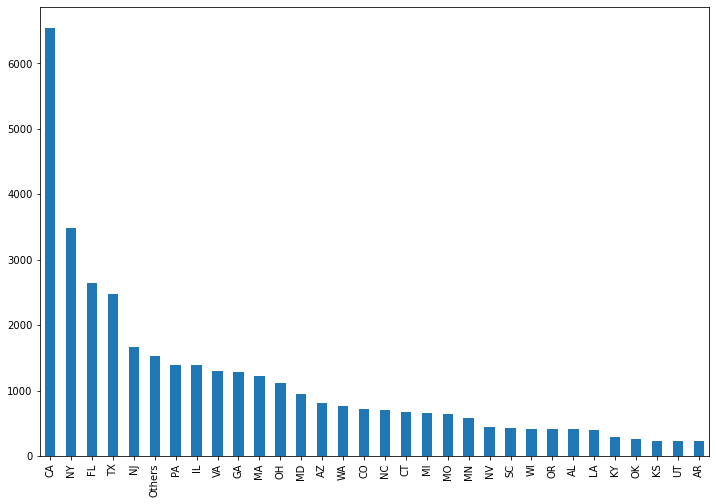

In [1151]:
#most loan appliers from CA
statestoconsider=[]
for i,value in loandata["addr_state"].value_counts().items():
    if value >=200:
        statestoconsider.append(i)
statestoconsider
    
loandata["addr_state"]=loandata["addr_state"].apply(lambda x: x if x in statestoconsider else "Others")
(loandata["addr_state"].value_counts()).plot(kind="bar", figsize=(12,8))

## 12.  pub_rec_bankruptcies
## Observation - Majority loan appliers have 0 bankruptcies

<AxesSubplot:>

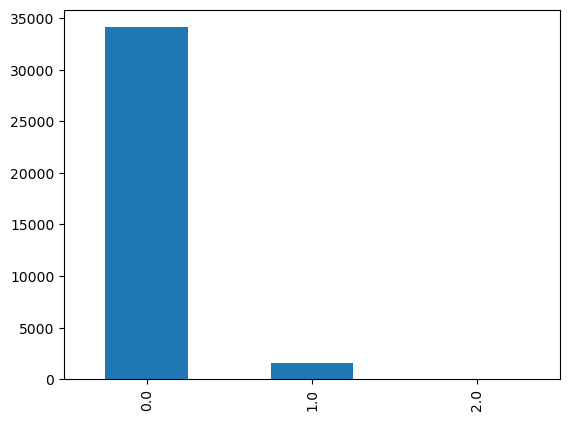

In [1152]:
mpl.style.use('default') 
loandata["pub_rec_bankruptcies"].value_counts().plot(kind="bar")

In [1153]:
loandata.shape
loandata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34815 entries, 0 to 39716
Data columns (total 34 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   loan_amnt               34815 non-null  int64   
 1   funded_amnt             34815 non-null  int64   
 2   funded_amnt_inv         34815 non-null  float64 
 3   term                    34815 non-null  object  
 4   int_rate                34815 non-null  float64 
 5   installment             34815 non-null  float64 
 6   grade                   34815 non-null  object  
 7   sub_grade               34815 non-null  object  
 8   emp_title               32727 non-null  object  
 9   emp_length              33828 non-null  object  
 10  home_ownership          34815 non-null  object  
 11  annual_inc              34815 non-null  float64 
 12  verification_status     34815 non-null  object  
 13  issue_d                 34815 non-null  object  
 14  loan_status           

In [1154]:
## Open- Shruti Loan Amount, funded amount etc

# Bivariate analysis 




### Observation- loan_amount, funded amount, funded amount invested , installment is highly correlated
### Observation- As expected, dti and income is negatively correlated

# Open- Jeyashree to replace the heatmap

<AxesSubplot:>

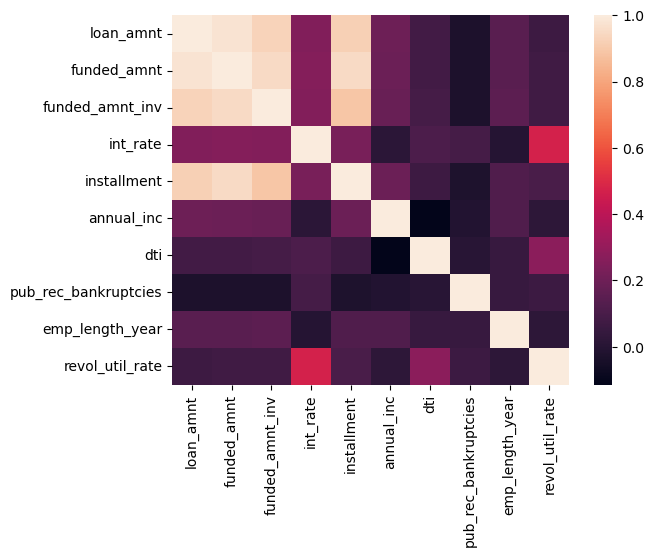

In [1155]:
## get the correlation
correlation=loandata.corr()
sns.heatmap(correlation)

## Loan status vs employment length

### Observation - employment length is not conclusive

### Observation - if employment length is NA,  has higher chance of charged off



<AxesSubplot:xlabel='emp_length'>

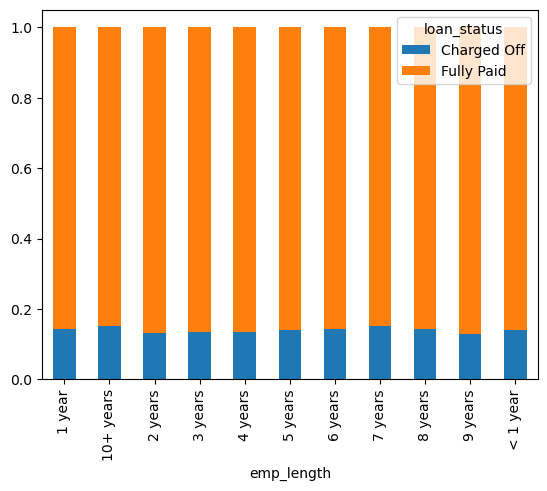

In [1156]:
loandata.groupby('emp_length').loan_status.value_counts(1).unstack().plot(kind='bar',stacked=True)

<AxesSubplot:xlabel='emp_length_year'>

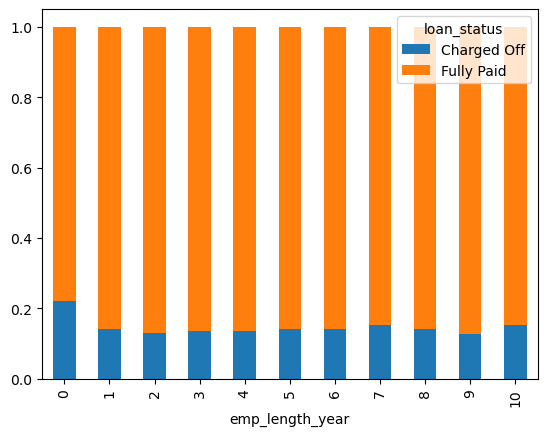

In [1157]:
loandata.groupby('emp_length_year').loan_status.value_counts(1).unstack().plot(kind='bar', stacked='True')

In [1158]:
loandata.groupby('emp_length_year').loan_status.value_counts(1)*100

emp_length_year  loan_status
0                Fully Paid     77.944112
                 Charged Off    22.055888
1                Fully Paid     85.933469
                 Charged Off    14.066531
2                Fully Paid     86.922513
                 Charged Off    13.077487
3                Fully Paid     86.459692
                 Charged Off    13.540308
4                Fully Paid     86.483932
                 Charged Off    13.516068
5                Fully Paid     85.874959
                 Charged Off    14.125041
6                Fully Paid     85.804878
                 Charged Off    14.195122
7                Fully Paid     84.788030
                 Charged Off    15.211970
8                Fully Paid     85.714286
                 Charged Off    14.285714
9                Fully Paid     87.163920
                 Charged Off    12.836080
10               Fully Paid     84.771115
                 Charged Off    15.228885
Name: loan_status, dtype: float64

## Loan status vs Loan Amount

### Insight:  Loan bucket 23K-30k have highest percentage chargeoff
### Trend- As loan amount increases, % charged off increases
### Because of correlation, loan amount , funded amount, funded_amnt_inv, installment will follow similar trend

<AxesSubplot:xlabel='loan_bkt'>

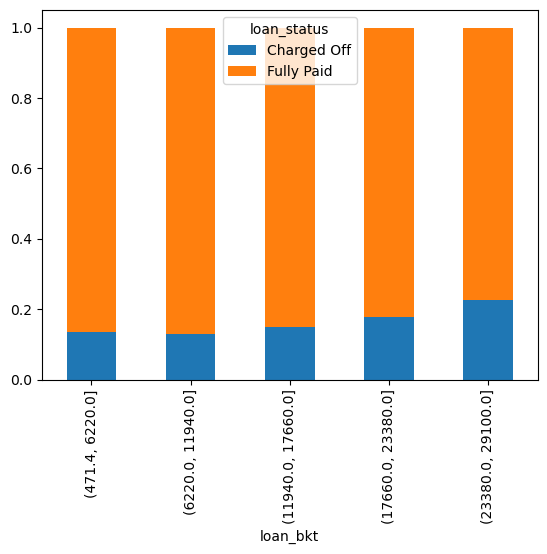

In [1159]:
loandata['loan_bkt'] = pd.cut(loandata.loan_amnt,5)
loandata['loan_bkt'].value_counts(1)*100
loandata.groupby('loan_bkt').loan_status.value_counts(1).unstack().plot(kind='bar',stacked=True)

## Loan Status vs Income Bucket
### Trends- As income increases increases, % charged off decreases
### Income <60k has a higher chance of charged off

<AxesSubplot:xlabel='income_bkt'>

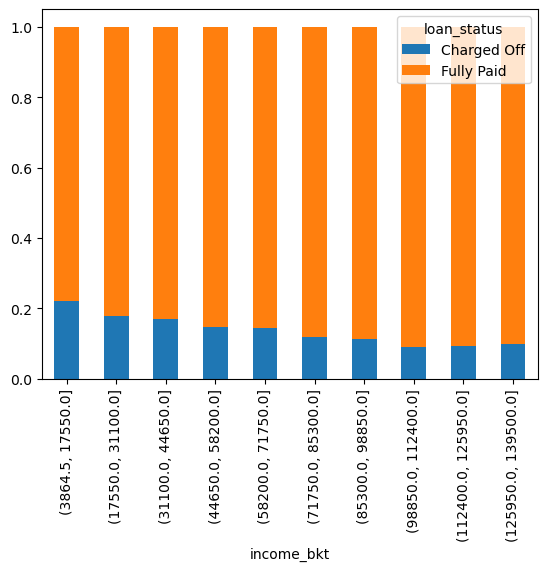

In [1163]:
loandata['income_bkt'] = pd.cut(loandata.annual_inc,10)
loandata['income_bkt'].value_counts(1)*100
loandata.groupby('income_bkt').loan_status.value_counts(1).unstack().plot(kind='bar',stacked=True)

Text(0.5, 0, 'Income')

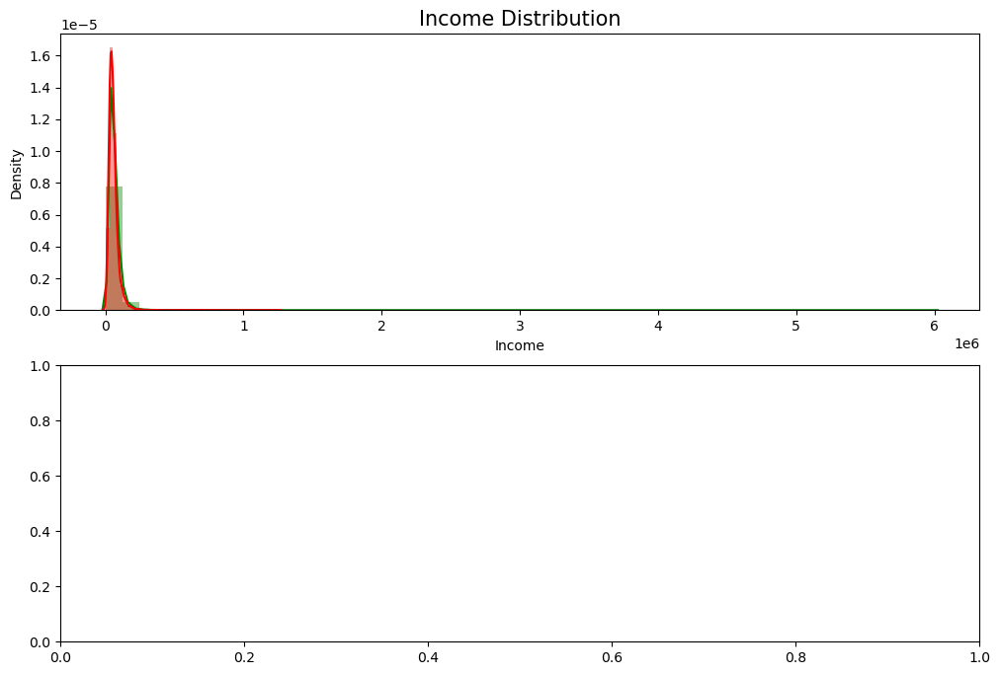

In [1164]:
# Income <60k has a higher chance of charged off
# defaulted vs non defaulted
loandata_chargedoff = loandata[loandata["loan_status"] == 'Charged Off']
loandata_paid = loandata[loandata["loan_status"] == 'Fully Paid']

fig, ax = plt.subplots(nrows=2, figsize=(12,8))


g1 = sns.distplot(loandata_paid["annual_inc"], ax=ax[0], 
             color="g")
g1 = sns.distplot(loandata_chargedoff["annual_inc"], ax=ax[0], 
             color='r')
g1.set_title("Income Distribution", fontsize=15)
g1.set_xlabel("Income")

## Loan Status vs Installment
### It is not conclusive

<AxesSubplot:xlabel='installment_buckets'>

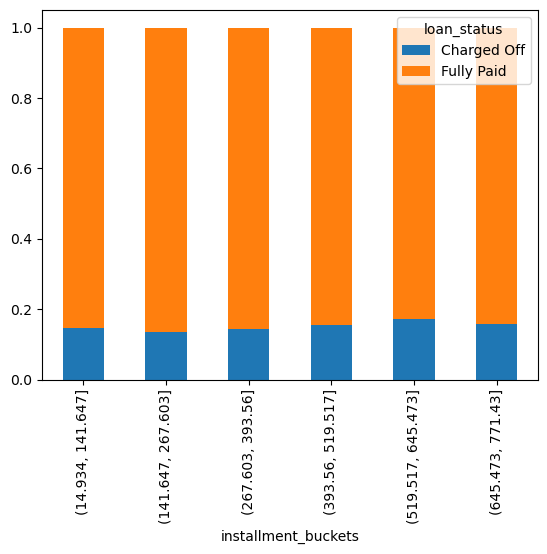

In [1166]:

loandata["installment_buckets"]=pd.cut(loandata["installment"],6)
loandata["installment_buckets"].value_counts()
loandata.groupby('installment_buckets').loan_status.value_counts(1).unstack().plot(kind='bar', stacked='True')

## Loan Status vs Employee Title
## Insights-  title as Accenture has no charged off, while Wallmart has highest Charged off
## if employee title is null, higher chance of charged off

In [1167]:
emp_title_array=[]
emp_buckets=loandata["emp_title"].value_counts()
for i, value in emp_buckets.items():
    if(value >= 25):
        emp_title_array.append(i)
loandata["emp_title_modified"]=loandata["emp_title"].apply(lambda x: x if x in emp_title_array  else "Others")
loandata["emp_title_modified"].value_counts()

Others                          34903
US Army                           117
Bank of America                   104
IBM                                54
AT&T                               51
Kaiser Permanente                  50
US Air Force                       50
Wells Fargo                        50
UPS                                47
USAF                               46
Walmart                            44
United States Air Force            41
Verizon Wireless                   37
US ARMY                            36
USPS                               36
Self Employed                      36
JP Morgan Chase                    35
Self                               35
Lockheed Martin                    35
Target                             35
State of California                34
JPMorgan Chase                     34
U.S. Army                          34
Northrop Grumman                   33
Department of Defense              32
US Navy                            32
Booz Allen H

<AxesSubplot:xlabel='emp_title_modified'>

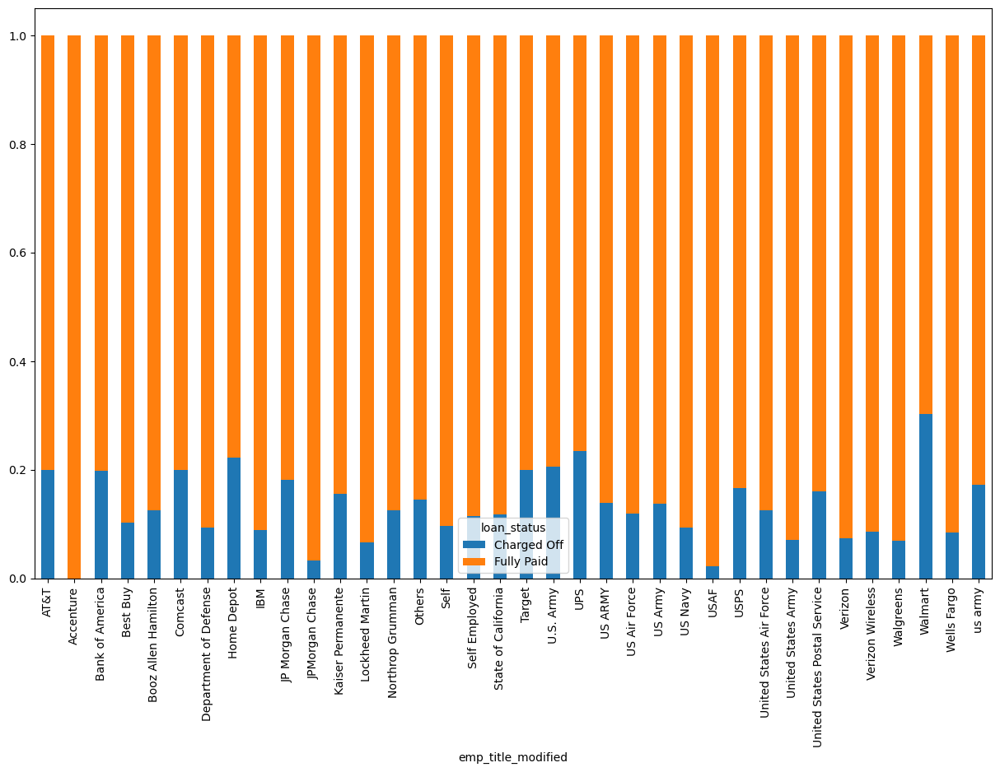

In [1168]:

loandata.groupby('emp_title_modified').loan_status.value_counts(1).unstack().plot(kind='bar',stacked=True, figsize=(15, 9))

#Wallmart has a higher percentage of charged off and Accenture has no charged Off

In [1169]:

loandata["emp_title"]
loandata["emp_title_absent"]=loandata["emp_title"].isna()

loandata["emp_title_absent"].value_counts()
loandata.groupby('emp_title_absent').loan_status.value_counts(1)

emp_title_absent  loan_status
False             Fully Paid     0.860300
                  Charged Off    0.139700
True              Fully Paid     0.797651
                  Charged Off    0.202349
Name: loan_status, dtype: float64

## loan status vs home ownership
### not conclusive

In [1170]:
#people will own home have a very small prcentage in this data of loan
loandata["home_ownership"].value_counts()

RENT        17798
MORTGAGE    15646
OWN          2839
OTHER          97
Name: home_ownership, dtype: int64

<AxesSubplot:xlabel='home_ownership'>

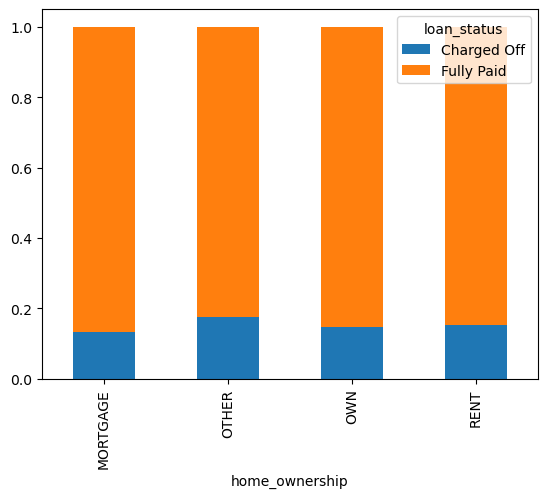

In [1171]:

loandata.groupby('home_ownership').loan_status.value_counts(1).unstack().plot(kind='bar',stacked=True)


## loan status vs bankrupties
## Insights - If bankruptcy is 2, highest(40%) chance of charged off

pub_rec_bankruptcies  loan_status
0.0                   Fully Paid     86.026546
                      Charged Off    13.973454
1.0                   Fully Paid     78.134846
                      Charged Off    21.865154
2.0                   Fully Paid     60.000000
                      Charged Off    40.000000
Name: loan_status, dtype: float64


<AxesSubplot:xlabel='pub_rec_bankruptcies'>

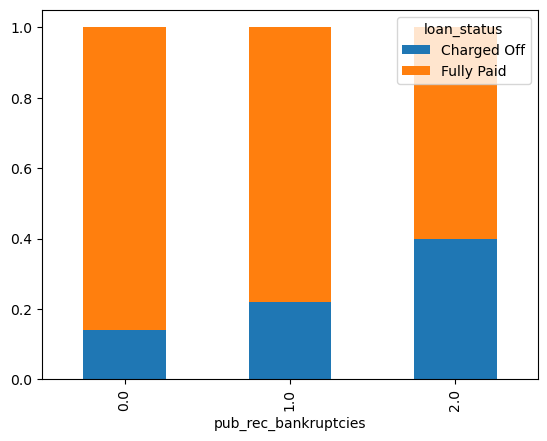

In [1172]:
print(loandata.groupby('pub_rec_bankruptcies').loan_status.value_counts(1)*100)
#people with two bankruptcies have a higher chance of charge off
#charged off increases with bankruptcy
loandata.groupby('pub_rec_bankruptcies').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True')



## loan status vs term
# Insights : chance of charged off is double when term is 60

term        loan_status
 36 months  Fully Paid     0.889939
            Charged Off    0.110061
 60 months  Fully Paid     0.749539
            Charged Off    0.250461
Name: loan_status, dtype: float64


<AxesSubplot:xlabel='term'>

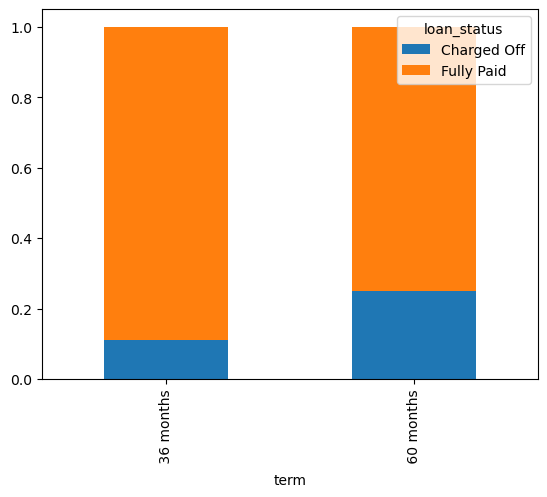

In [1174]:
# charged off percentage is double when term is 60
print(loandata.groupby('term').loan_status.value_counts(1))
loandata.groupby('term').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True')

<AxesSubplot:xlabel='term'>

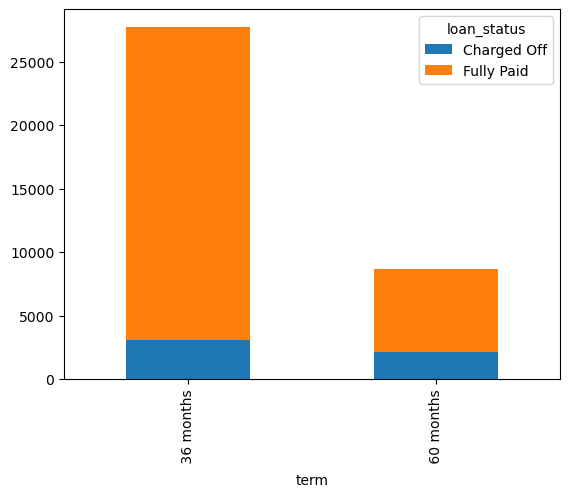

In [1175]:
loandata.groupby('term').loan_status.value_counts().unstack().plot(kind='bar',stacked='True')

## loan status vs dti
## dti is not showing a trend, 18-24% has highest chance of charged off 

In [1177]:
loandata["dti_bkt"]=pd.cut(loandata.dti,5,labels=["0-6","6-12","12-18","18-24","24-30"])

In [1178]:
loandata["dti_bkt"].value_counts()

12-18    10626
6-12      9664
18-24     8447
0-6       6040
24-30     1603
Name: dti_bkt, dtype: int64

<AxesSubplot:xlabel='dti_bkt'>

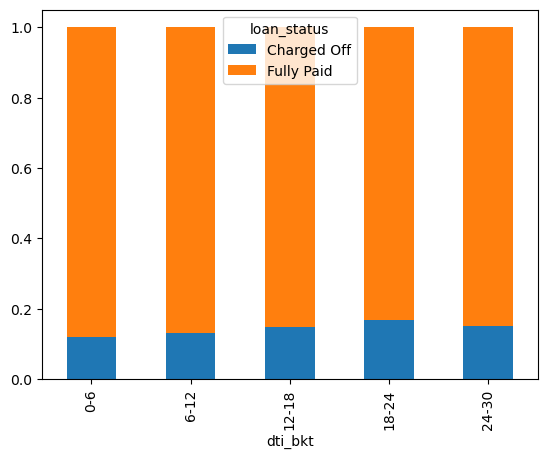

In [1180]:
loandata.groupby('dti_bkt').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True')
# as dti increases , percentage chargeoff increases

In [800]:
## loan status vs verification_status
## verification_status is not conclusive

<AxesSubplot:xlabel='verification_status'>

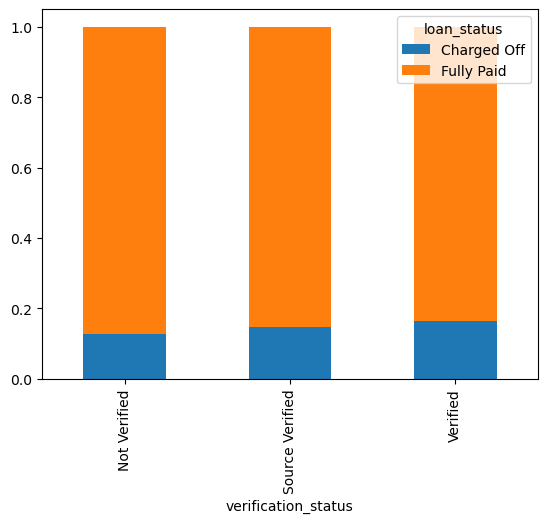

In [1181]:
#verification_status no trends

loandata["verification_status"].value_counts()
loandata.groupby('verification_status').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True')

## loan status vs purpose
## Insights: Small business has highest(27%) chance of charged off 


<AxesSubplot:xlabel='purpose'>

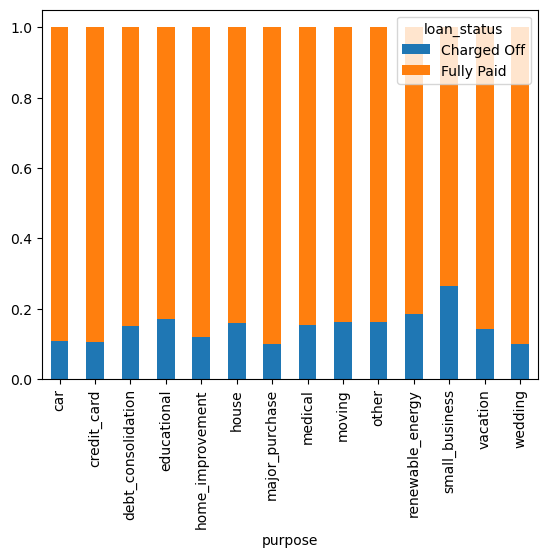

In [1182]:
#small_business has a higher chance of charged off, wedding, car and credit card has lowest probability of charged off  
loandata.groupby('purpose').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True')

## loan_status vs month


<AxesSubplot:xlabel='issue_d_month'>

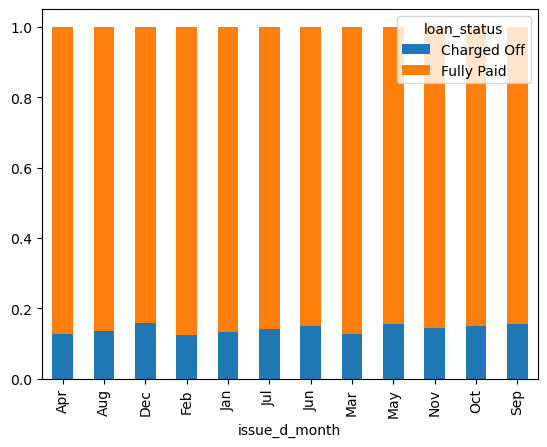

In [1184]:
loandata.groupby('issue_d_month').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True')

## loanstatus vs subgrade
## As subgrade increases, % charged off increases
## Charged off probability is very high(50%) for F5

<AxesSubplot:xlabel='sub_grade'>

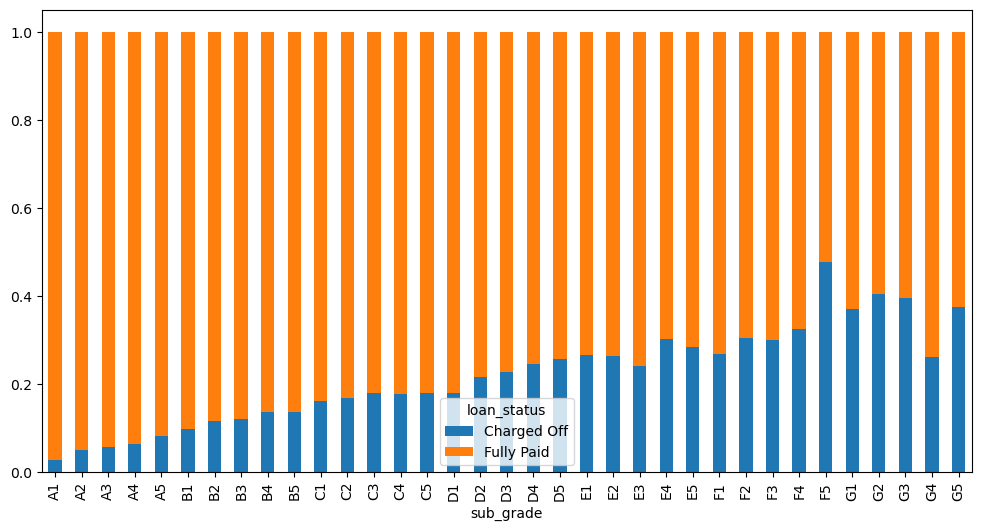

In [1185]:
loandata.groupby('sub_grade').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True', figsize=(12, 6))

## loanstatus vs grade
## As grade increases(A to B to C), % charged off increases


<AxesSubplot:xlabel='grade'>

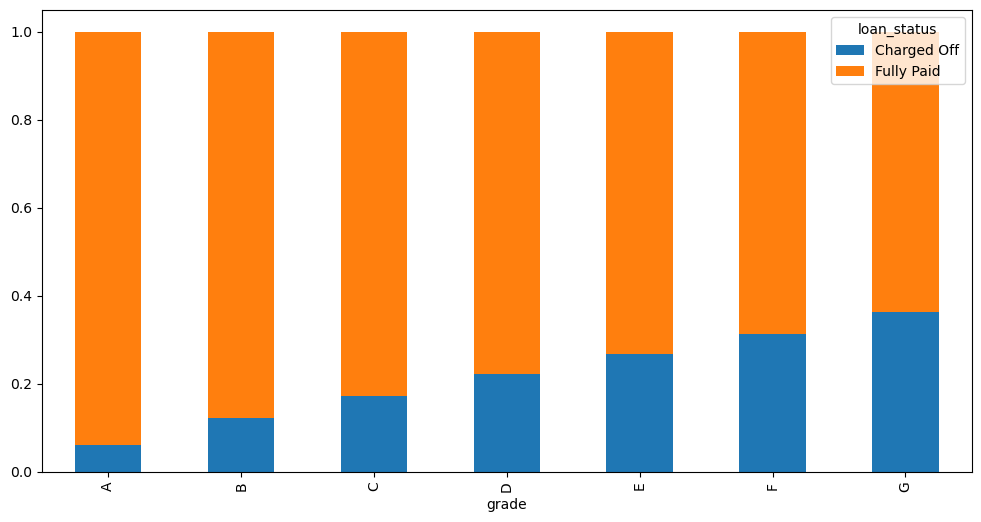

In [1188]:
loandata.groupby('grade').loan_status.value_counts(1).unstack().plot(kind='bar', figsize=(12, 6), stacked=True)

<AxesSubplot:xlabel='addr_state'>

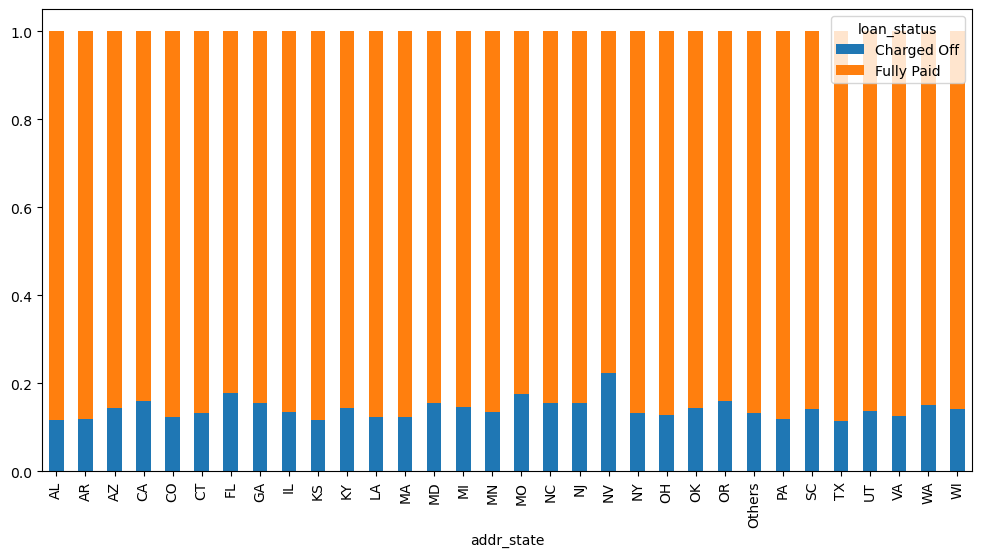

In [1189]:
loandata.groupby('addr_state').loan_status.value_counts(1).unstack().plot(kind='bar',stacked='True', figsize=(12, 6))

## When grade is G and annual is less than 65k, chance of defaulter is high

In [1191]:

tr0 = go.Box(
    y=loandata_paid["annual_inc"],
    x=loandata_paid["grade"],
    name='Good credit',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['annual_inc'],
    x=loandata_chargedoff['grade'],
    name='Bad credit',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Annul Income',
        zeroline=False
    ),
    xaxis=dict(
        title='grade'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

In [1192]:
#When purpose  is home improvement, major purpose and income is lower than 80k and 60k respectively then higher chance of charged off 
tr0 = go.Box(
    y=loandata_paid["annual_inc"],
    x=loandata_paid["purpose"],
    name='Good credit',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['annual_inc'],
    x=loandata_chargedoff['purpose'],
    name='Bad credit',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='Income',
        zeroline=False
    ),
    xaxis=dict(
        title='Purpose'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

In [1194]:

tr0 = go.Box(
    y=loandata_paid["loan_amnt"],
    x=loandata_paid["purpose"],
    name='Good credit',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['loan_amnt'],
    x=loandata_chargedoff['purpose'],
    name='Bad credit',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='loan_amnt',
        zeroline=False
    ),
    xaxis=dict(
        title='Purpose'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

## When purpose  is small business and loan amount is higher then higher chance of charged off 

## insights - for states WA, TX, NJ, VA higher loan amount has a higher chance of charged off

In [1196]:

tr0 = go.Box(
    y=loandata_paid["loan_amnt"],
    x=loandata_paid["addr_state"],
    name='Good credit',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['loan_amnt'],
    x=loandata_chargedoff['addr_state'],
    name='Bad credit',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='loan_amnt',
        zeroline=False
    ),
    xaxis=dict(
        title='addr_state'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

## Insights- #for all purposes highet dti means higher chance of charged off, but educational, lower dti also leads to chargeoff

In [1197]:

tr0 = go.Box(
    y=loandata_paid["dti"],
    x=loandata_paid["purpose"],
    name='Good credit',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['dti'],
    x=loandata_chargedoff['purpose'],
    name='Bad credit',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='dti',
        zeroline=False
    ),
    xaxis=dict(
        title='home_ownership'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

## Observation- Funded Amount Inv is higher if source is verified

In [1199]:

tr0 = go.Box(
    y=loandata_paid["funded_amnt_inv"],
    x=loandata_paid["verification_status"],
    name='Fully Paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['funded_amnt_inv'],
    x=loandata_chargedoff['verification_status'],
    name='Charged off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='funded_amnt_inv',
        zeroline=False
    ),
    xaxis=dict(
        title='verification_status'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

In [1200]:

tr0 = go.Box(
    y=loandata_paid["funded_amnt_inv"],
    x=loandata_paid["home_ownership"],
    name='Fully Paid',
    marker=dict(
        color='#3D9970'
    )
)

tr1 = go.Box(
    y=loandata_chargedoff['funded_amnt_inv'],
    x=loandata_chargedoff['home_ownership'],
    name='Charged off',
    marker=dict(
        color='#FF4136'
    )
)
    
data = [tr0, tr1]

layout = go.Layout(
    yaxis=dict(
        title='funded_amnt_inv',
        zeroline=False
    ),
    xaxis=dict(
        title='home_ownership'
    ),
    boxmode='group'
)
fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='box-age-cat')

0.6448082722964239